In [1]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import corner
import emcee
import json

In [2]:
pfile = "tests/files/real_mini_cube.json"
with open(pfile) as f:
    mcmc_dict = json.load(f)

# Select from dictionary the necessary parameters to be changed
labels = mcmc_dict['mcmc']['parameter_order']

# labels = ["sfr_n", "alpha", "lmean", "lsigma", "lEmax", "gamma", "H0"]

# filenames = ['mcmc/w32_s1000_1', 'mcmc/w32_s1000_2', 'mcmc/w32_s1000_3', 'mcmc/w32_s1000_4']
filenames = ['mcmc/w40_s2000', 'mcmc/w40_s2000_2']
samples = []

for filename in filenames:
    reader = emcee.backends.HDFBackend(filename + '.h5')
    samples.append(reader.get_chain())

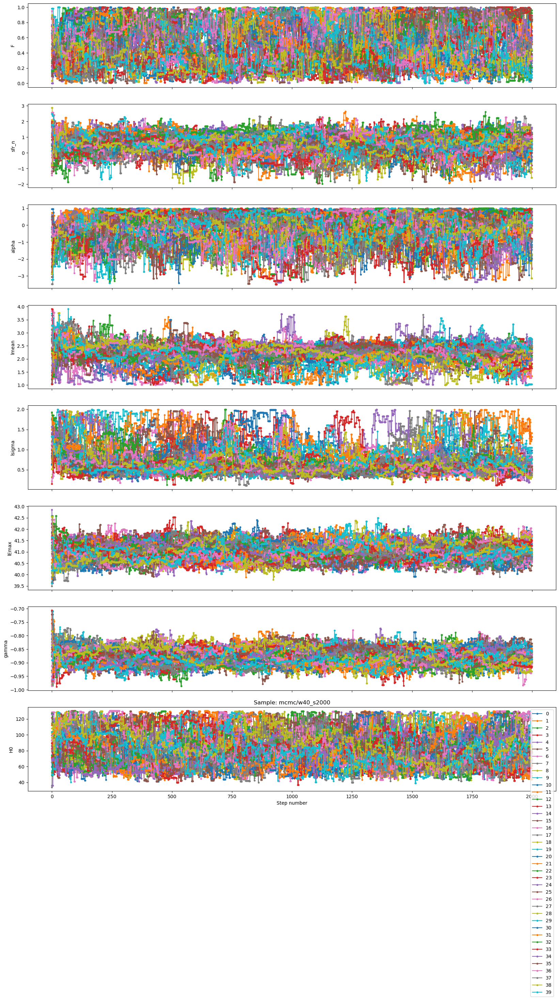

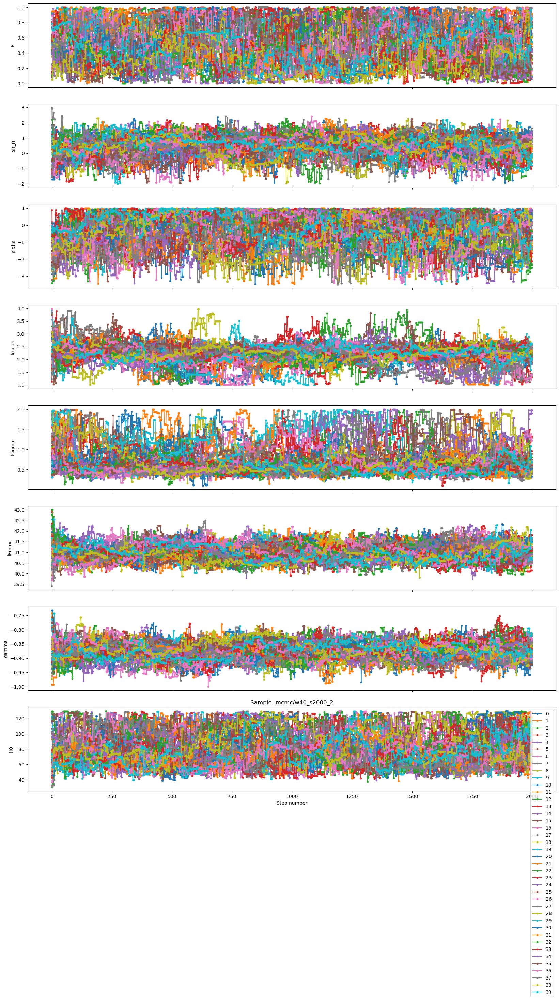

In [3]:
for j,sample in enumerate(samples):
    fig, axes = plt.subplots(sample.shape[2], 1, figsize=(20,30), sharex=True)
    plt.title("Sample: " + filenames[j])
    for i,ax in enumerate(axes):
        for k in range(sample.shape[1]):
            ax.plot(sample[:,k,i], '.-', label=str(k))

        ax.set_ylabel(labels[i])
    
    axes[-1].set_xlabel("Step number")
    axes[-1].legend()


In [4]:
# https://emcee.readthedocs.io/en/stable/tutorials/autocorr/#a-more-realistic-example
def next_pow_two(n):
    i = 1
    while i < n:
        i = i << 1
    return i

def autocorr_func_1d(x, norm=True):
    x = np.atleast_1d(x)
    if len(x.shape) != 1:
        raise ValueError("invalid dimensions for 1D autocorrelation function")
    n = next_pow_two(len(x))

    # Compute the FFT and then (from that) the auto-correlation function
    f = np.fft.fft(x - np.mean(x), n=2 * n)
    acf = np.fft.ifft(f * np.conjugate(f))[: len(x)].real
    acf /= 4 * n

    # Optionally normalize
    if norm:
        acf /= acf[0]

    return acf

# Automated windowing procedure following Sokal (1989)
def auto_window(taus, c):
    m = np.arange(len(taus)) < c * taus
    if np.any(m):
        return np.argmin(m)
    return len(taus) - 1

def autocorr(y, c=5.0):
    f = np.zeros(y.shape[1])
    for yy in y:
        f += autocorr_func_1d(yy)
    f /= len(y)
    taus = 2.0 * np.cumsum(f) - 1.0
    window = auto_window(taus, c)
    return taus[window]

# def autocorr_ml(y, thin=1, c=5.0):
#     # Compute the initial estimate of tau using the standard method
#     init = autocorr(y, c=c)
#     z = y[:, ::thin]
#     N = z.shape[1]

#     # Build the GP model
#     tau = max(1.0, init / thin)
#     kernel = terms.RealTerm(
#         np.log(0.9 * np.var(z)),
#         -np.log(tau),
#         bounds=[(-5.0, 5.0), (-np.log(N), 0.0)],
#     )
#     kernel += terms.RealTerm(
#         np.log(0.1 * np.var(z)),
#         -np.log(0.5 * tau),
#         bounds=[(-5.0, 5.0), (-np.log(N), 0.0)],
#     )
#     gp = celerite.GP(kernel, mean=np.mean(z))
#     gp.compute(np.arange(z.shape[1]))

    # # Define the objective
    # def nll(p):
    #     # Update the GP model
    #     gp.set_parameter_vector(p)

    #     # Loop over the chains and compute likelihoods
    #     v, g = zip(*(gp.grad_log_likelihood(z0, quiet=True) for z0 in z))

    #     # Combine the datasets
    #     return -np.sum(v), -np.sum(g, axis=0)

    # # Optimize the model
    # p0 = gp.get_parameter_vector()
    # bounds = gp.get_parameter_bounds()
    # soln = minimize(nll, p0, jac=True, bounds=bounds)
    # gp.set_parameter_vector(soln.x)

    # # Compute the maximum likelihood tau
    # a, c = kernel.coefficients[:2]
    # tau = thin * 2 * np.sum(a / c) / np.sum(a)
    # return tau

In [5]:
# Reject walkers with bad autocorrelation values
def auto_corr_rej(samples, burnin=0):
    good_samples = []

    # Loop through each sample and generate a list of good walkers and bad walkers
    for j,sample in enumerate(samples): 
        # burnin=200
        good_walkers = []
        bad_walkers = []


        # for i in range(sample.shape[1]):
        #     # if np.all(sample[burnin:burnin+30,i,0] == sample[burnin,i,0]):
        #     if ( np.std(sample[burnin:burnin+30,i,0] ) )
        #         bad_walkers.append(i)
        #     else:
        #         good_walkers.append(i)

        # Loop through each walker in the current sample
        for i in range(sample.shape[1]):
            bad = False

            # Loop through each parameter for the walker
            for k in range(sample.shape[2]):

                # If any of the parameters have a bad autocorrelation function then set as a bad walker
                acf = autocorr_func_1d(sample[burnin:,i,k], norm=False)
                if np.max(acf) < 1e-10:
                    bad = True
                    break

            if bad:
                bad_walkers.append(i)
            else:
                good_walkers.append(i)
            
            # fig = plt.figure()
            # plt.title(str(j) + ", " + str(i))
            # ax = fig.add_subplot(1,1,1)
            # ax.plot(acf)

        print("Discarded walkers for sample " + str(j) + ": " + str(bad_walkers))

        # Add the new sample with the bad walkers discarded to the good_samples list
        good_samples.append(sample[burnin:,good_walkers,:])

    return good_samples

# Reject walkers with small standard deviations
def std_rej(samples, burnin=0):
    good_samples = []

    if not type(burnin) == list:
        burnin = [burnin for i in range(len(samples))]

    # Loop through each sample
    for i, sample in enumerate(samples):
        bad_walkers = []
        good_walkers = []

        # For each parameter
        for k in range(sample.shape[2]):
            sd = []

            # Loop through every walker and get a list of the standard deviations
            for j in range(sample.shape[1]):
                sd.append(np.std(sample[burnin[i]:burnin[i]+100,j,k]))
            
            # Normalise standard deviation
            sd = sd / np.max(sd)

            # Flag any walkers with standard deviations less than 1e-2
            # bad_walkers = np.flatnonzero(sd < 1e-2)
            temp = []
            for m in range(len(sd)):
                if sd[m] < 1e-2:
                    temp.append(m)
            bad_walkers.append(temp)
            # bad_walkers.append([m if sd[m] < 1e-2 else _ for m in range(len(sd))])
        
        bad_walkers = np.unique((np.array(bad_walkers)).flatten())

        print("Discarded walkers for sample " + str(i) + ": " + str(bad_walkers))
        for l in range(sample.shape[1]):
            if l not in bad_walkers:
                good_walkers.append(l)

        # Add the new sample with the bad walkers discarded to the good_samples list
        good_samples.append(sample[burnin[i]:,good_walkers,:])
    
    return good_samples

In [6]:
x = np.array([[[0,1],[2,3]],[[4,5],[6,7]]])
print(x[:,:,0])
print(x.reshape(4,2)[:,0])

[[0 2]
 [4 6]]
[0 2 4 6]


In [7]:
good_samples = std_rej(samples, burnin=0)
# _ = auto_corr_rej(samples, burnin=0)

Discarded walkers for sample 0: []
Discarded walkers for sample 1: []


(2000, 40, 8)
(2000, 40, 8)


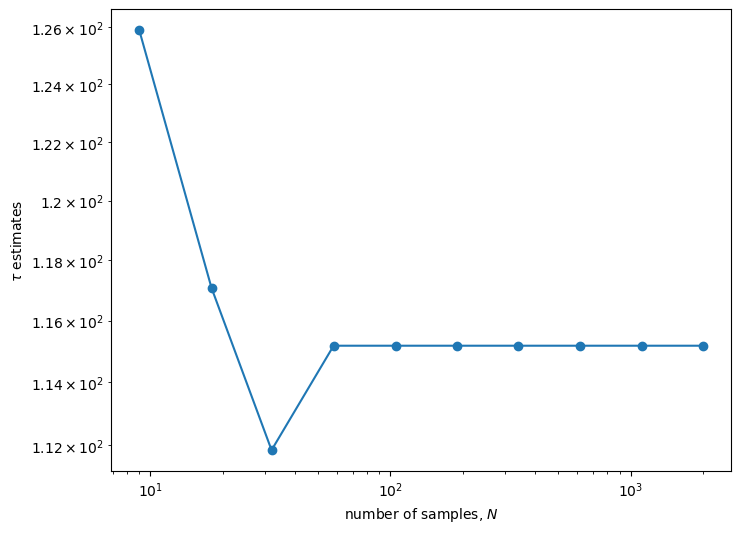

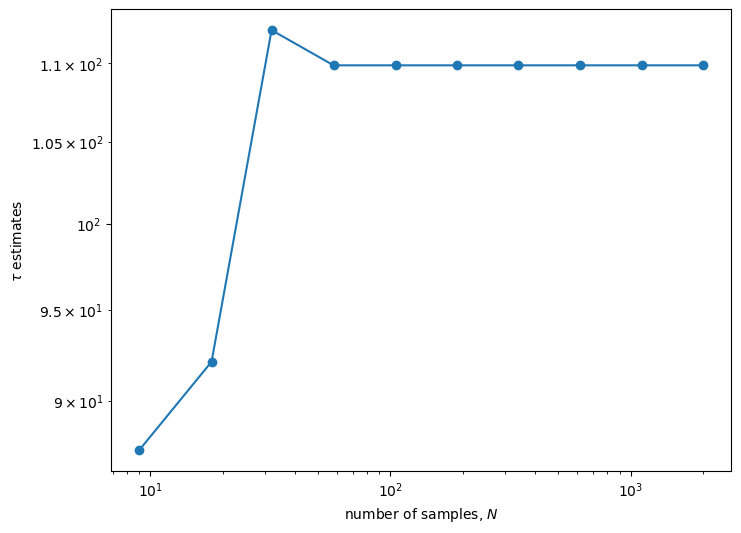

In [8]:
burnin = []
for sample in samples:
    print(sample.shape)
    # Compute the estimators for a few different chain lengths
    N = np.exp(np.linspace(np.log(10), np.log(sample.shape[0]), 10)).astype(int)
    new = np.empty(len(N))
    for i, n in enumerate(N):
        new[i] = autocorr(sample[:, :n, 0].T)

    # Plot the comparisons
    fig, ax = plt.subplots(1,1,figsize=(8,6))
    ax.loglog(N, new, "o-", label="new")
    ylim = ax.get_ylim()
    ax.plot(N, N / 50.0, "--k", label=r"$\tau = N/50$")
    ax.set_ylim(ylim)
    ax.set_xlabel("number of samples, $N$")
    ax.set_ylabel(r"$\tau$ estimates")
    # ax.legend(fontsize=14);

    burnin.append(int(1.5*new[-1]))

In [9]:
# good_samples = std_rej(samples, burnin=200)
# _ = auto_corr_rej(samples, burnin=burnin)

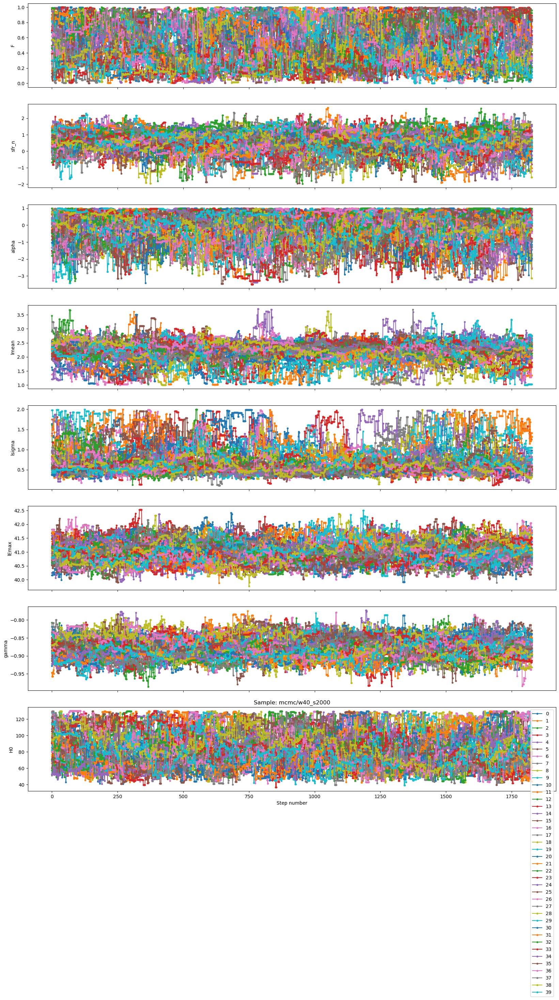

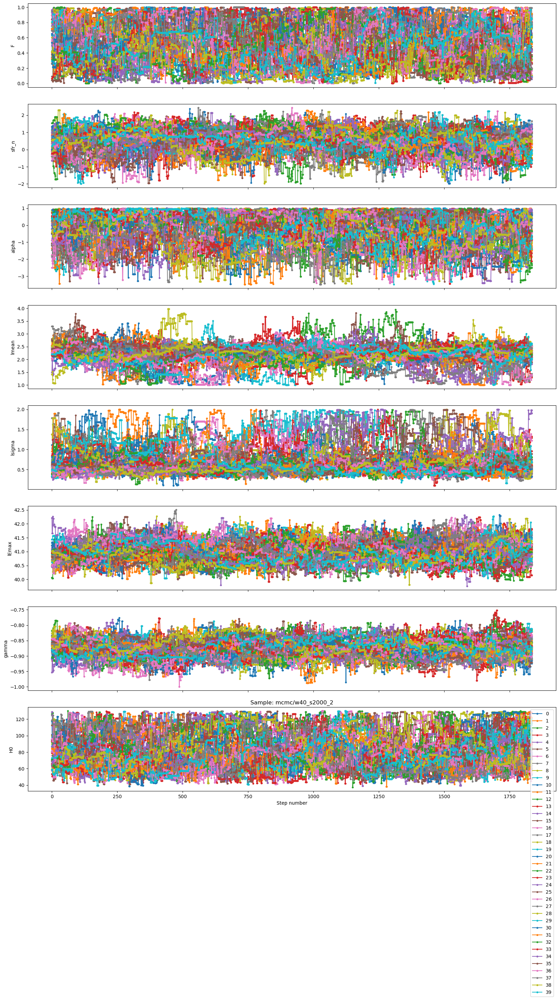

In [10]:
for j,sample in enumerate(good_samples):
    fig, axes = plt.subplots(sample.shape[2], 1, figsize=(20,30), sharex=True)
    plt.title("Sample: " + filenames[j])
    for i,ax in enumerate(axes):
        for k in range(sample.shape[1]):
            ax.plot(sample[burnin[j]:,k,i], '.-', label=str(k))

        ax.set_ylabel(labels[i])
    
    axes[-1].set_xlabel("Step number")
    axes[-1].legend()


In [11]:
# Enforce more restrictive priors on a parameter
def change_priors(sample, param_num, max=np.inf, min=-np.inf):

    condition = np.logical_and(sample[:,param_num] > min, sample[:,param_num] < max)
    good_idxs = np.flatnonzero(condition)

    return sample[good_idxs, :]

In [12]:
# Get the final sample without burnin and without bad walkers
final_sample = [[] for i in range(samples[0].shape[2])]
print(burnin)

for j,sample in enumerate(good_samples):
    for i in range(sample.shape[2]):
        final_sample[i].append(sample[200:,:,i].flatten())
final_sample = np.array([np.hstack(final_sample[i]) for i in range(len(final_sample))]).T

# final_sample = change_priors(final_sample, 2, min=1.0)
# final_sample = change_priors(final_sample, 3, max=2.0)
# final_sample = change_priors(final_sample, 1, max=1.0, min=-3.5)

print(final_sample.shape)


[172, 164]
(144000, 8)


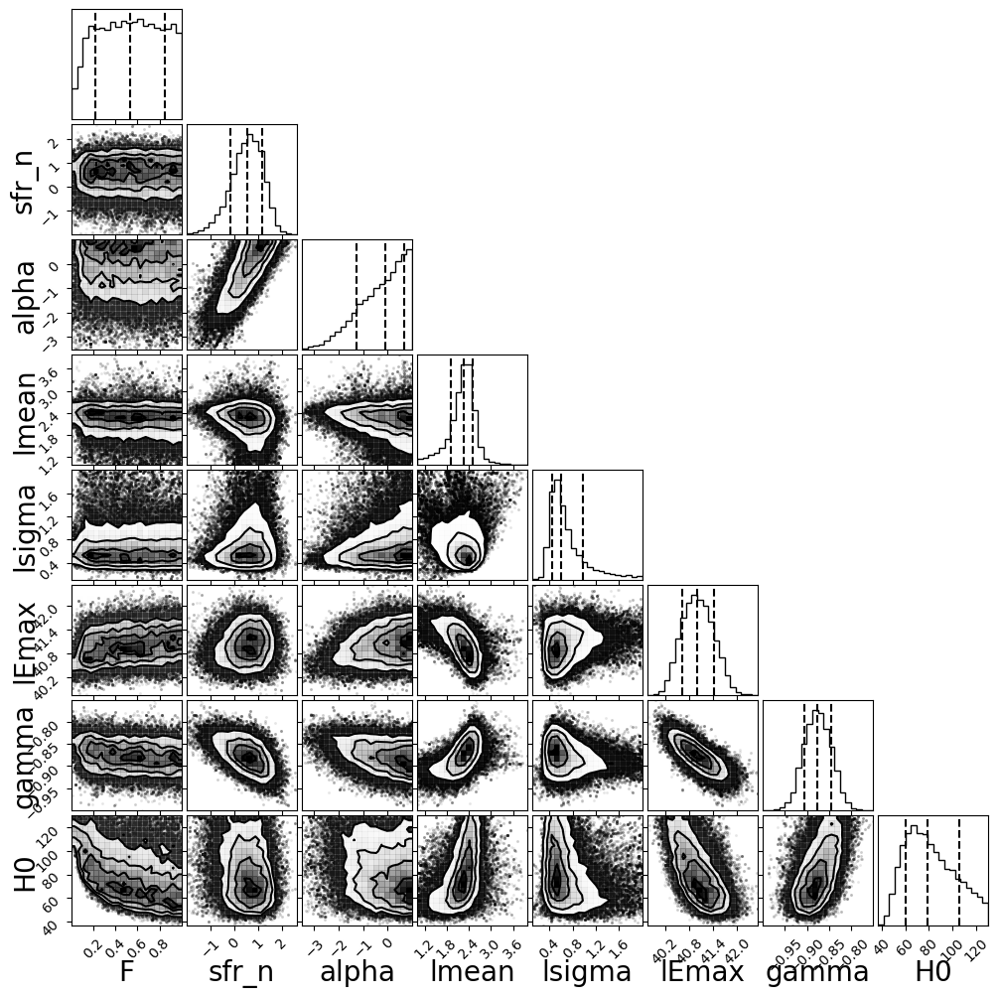

In [13]:
fig = plt.figure(figsize=(10,10))
corner.corner(final_sample,labels=labels, show_titles=False, fig=fig,title_kwargs={"fontsize": 20},label_kwargs={"fontsize": 20}, quantiles=[0.16,0.5,0.84]);

39
[22 47 42 38 23 94 55 73 18 81 30 20 79 53 27 58 67 17 89 66 84 65 93 12
 31 51 35 92 71 69 50 91 74 44 45 21 39 96 52 19 54 76 40 56 15 78 60 88
 25 49 36 62 57 90 48 37 72 59 61 46 64]
[1.02463894 1.02741762 1.03297499 1.03783768 1.03922702 1.04547906
 1.04964708 1.04964708 1.0538151  1.05659378 1.05728845 1.0586778
 1.06215115 1.06284582 1.06354049 1.06492983 1.06631917 1.06701384
 1.06840318 1.07673923 1.07812857 1.07882324 1.08090725 1.08368593
 1.08576994 1.08785396 1.08785396 1.09063264 1.09271665 1.09549533
 1.09757934 1.09966335 1.10383138 1.10938874 1.11286209 1.11355676
 1.11425143 1.11703012 1.1198088  1.1198088  1.12119814 1.12119814
 1.12189281 1.1267555  1.12745017 1.12883951 1.13509155 1.13995424
 1.13995424 1.13995424 1.14273292 1.1455116  1.1455116  1.14829029
 1.14967963 1.15315298 1.15593166 1.16704639 1.20247458 1.20316925
 1.218452  ]
F: 0.6450896697335613 (-0.5198308073663611/+0.31989588145622205)
73
[70 45 44 69 46 67 49 68 66 47 53 51 50 64 48 63 52 58 65 61

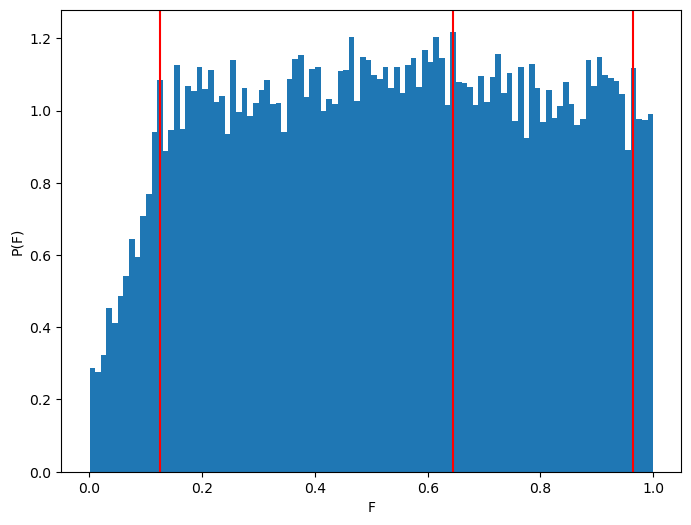

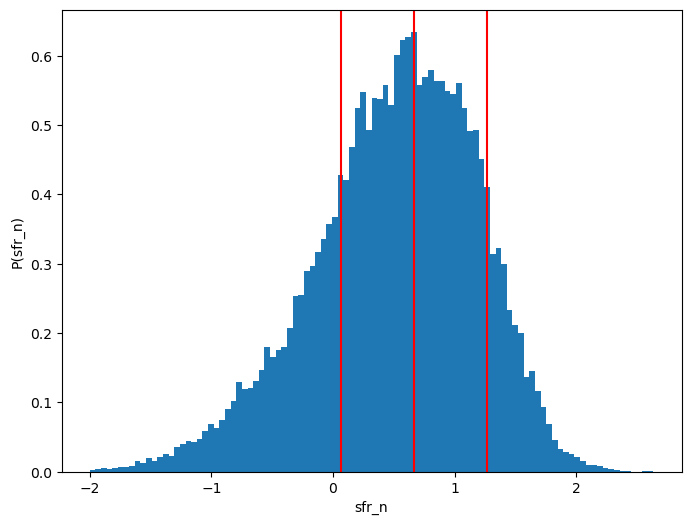

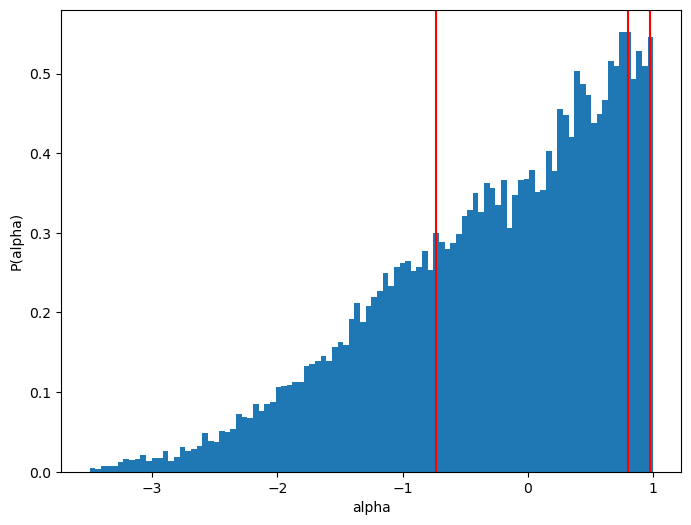

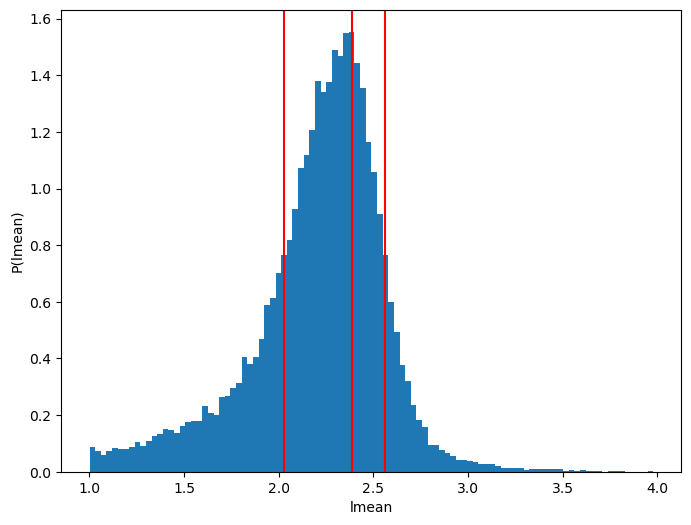

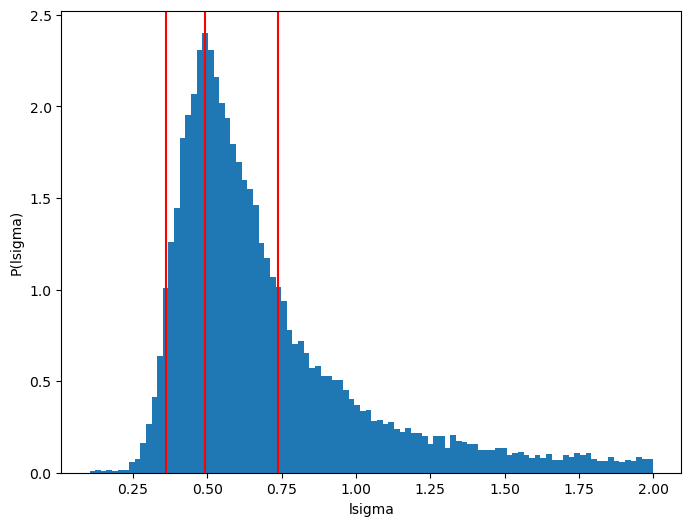

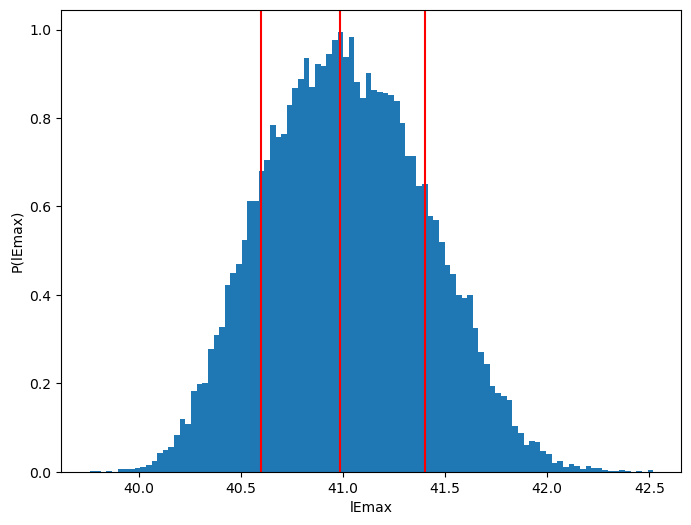

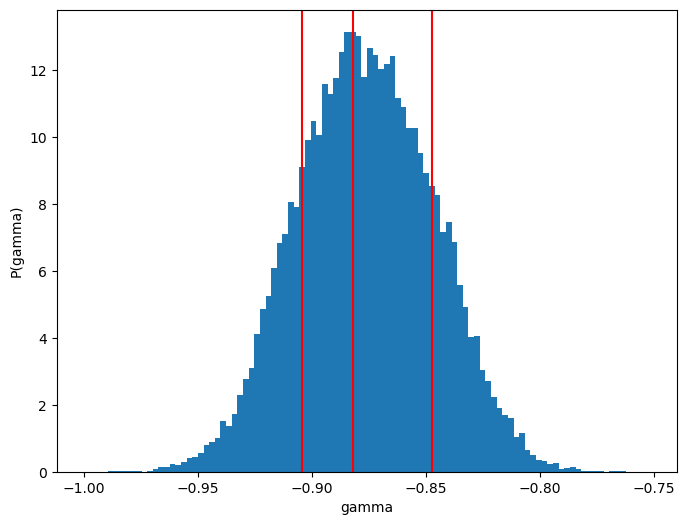

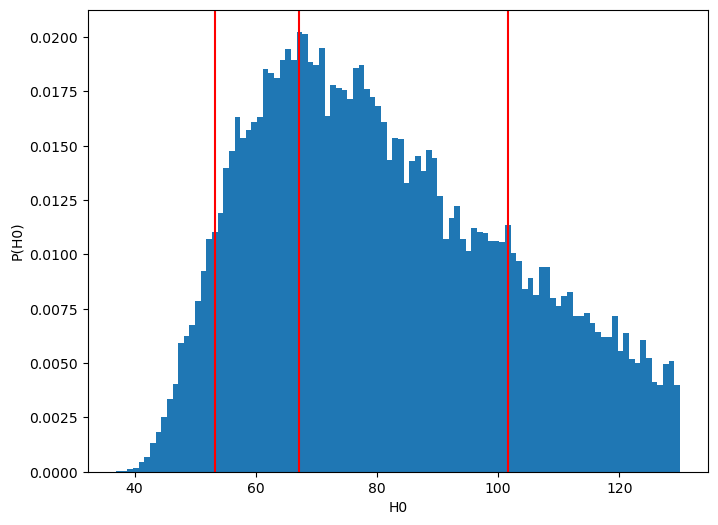

In [14]:
nBins = 100
win_len = int(nBins/10)
CL = 0.68

for i in range(len(labels)):
    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(1,1,1)
    hist, bin_edges, _ = ax.hist(final_sample[:,i], bins=nBins, density=True)
    bin_width = bin_edges[1] - bin_edges[0]
    bins = -np.diff(bin_edges)/2.0 + bin_edges[1:]

    ax.set_xlabel(labels[i])
    ax.set_ylabel("P("+labels[i]+")")

    ordered_idxs = np.argsort(hist)

    sum = hist[ordered_idxs[0]] * bin_width
    j = 1
    while(sum < 1-CL):
        sum += hist[ordered_idxs[j]] * bin_width
        j = j+1
    
    print(j)
    print(ordered_idxs[j:])
    print(hist[ordered_idxs[j:]])

    mode = bins[ordered_idxs[-1]]
    lower = bins[np.min(ordered_idxs[j:])]
    upper = bins[np.max(ordered_idxs[j:])]
    u_lower = mode - lower
    u_upper = upper - mode
    ax.axvline(lower, color='r')
    ax.axvline(mode, color='r')
    ax.axvline(upper, color='r')
    print(f'{labels[i]}: {mode} (-{u_lower}/+{u_upper})')